# Introduction
The primary objective of this project is to predict the popularity of online news articles, categorized by the number of shares, using neural network models. The dataset from the UCI Machine Learning Repository includes various features describing over 39,600 articles. Predicting article popularity has significant implications for publishers and marketers who aim to maximize readership and engagement.

Steps to Address the Problem:

1. **Exploratory Data Analysis (EDA)**: Understand the dataset's characteristics and preliminary relationships between features.
2. **Data Preparation**: Clean and preprocess the data to enhance model performance, including handling missing values and feature scaling.
3. **Prepped Data Review**: Reassess the dataset through exploratory data analysis to verify the effectiveness of our data preparation steps, ensuring optimized distributions and correlations for neural network modeling.
4. **Neural Network Modeling**: Design and train neural networks, tuning their architectures and parameters for optimal performance.
5. **Model Evaluation**: Use classification metrics to compare models and select the best-performing one.
6. **Conclusion**: Summarize the findings and discuss potential improvements and real-world implications of the models.

Conclusions: Finally, I will summarize the findings, discuss the implications of the neural network modeling for predicting news article popularity, and suggest future directions for extending this work.

In [1]:
# Libaries import
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from copy import copy
import warnings
warnings.filterwarnings('ignore')

## Reading the data

In [2]:
data = pd.read_csv("https://raw.githubusercontent.com/minjaelee0522/DAV6150/master/M4%20Feature%20Selection%20%26%20Dimension%20Reduction/M4_Data.csv")
data.head(n=4)
origianl_data = copy(data)
data.columns

Index(['url', ' timedelta', ' n_tokens_title', ' n_tokens_content',
       ' n_unique_tokens', ' n_non_stop_words', ' n_non_stop_unique_tokens',
       ' num_hrefs', ' num_self_hrefs', ' num_imgs', ' num_videos',
       ' average_token_length', ' num_keywords', ' data_channel_is_lifestyle',
       ' data_channel_is_entertainment', ' data_channel_is_bus',
       ' data_channel_is_socmed', ' data_channel_is_tech',
       ' data_channel_is_world', ' kw_min_min', ' kw_max_min', ' kw_avg_min',
       ' kw_min_max', ' kw_max_max', ' kw_avg_max', ' kw_min_avg',
       ' kw_max_avg', ' kw_avg_avg', ' self_reference_min_shares',
       ' self_reference_max_shares', ' self_reference_avg_sharess',
       ' weekday_is_monday', ' weekday_is_tuesday', ' weekday_is_wednesday',
       ' weekday_is_thursday', ' weekday_is_friday', ' weekday_is_saturday',
       ' weekday_is_sunday', ' is_weekend', ' LDA_00', ' LDA_01', ' LDA_02',
       ' LDA_03', ' LDA_04', ' global_subjectivity',
       ' global_sent

# 1&2. EDA & Data Preparation

In [3]:
# Strip whitespace from column names
data.columns = data.columns.str.strip()

# Here we drop the two non-preditive (url and timedelta) attributes. They won't contribute anything
data.drop(labels=['url', 'timedelta'], axis = 1, inplace=True)
data.head(n=4)

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,0.0,4.680365,...,0.100000,0.7,-0.350000,-0.600,-0.200000,0.5,-0.1875,0.0,0.1875,593
1,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,0.0,4.913725,...,0.033333,0.7,-0.118750,-0.125,-0.100000,0.0,0.0000,0.5,0.0000,711
2,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,0.0,4.393365,...,0.100000,1.0,-0.466667,-0.800,-0.133333,0.0,0.0000,0.5,0.0000,1500
3,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,0.0,4.404896,...,0.136364,0.8,-0.369697,-0.600,-0.166667,0.0,0.0000,0.5,0.0000,1200


In [4]:
# describing the data
data.describe()
# from the data, there will be need to normailze the data if their will be need for condersing any machine learning model.

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
count,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,...,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000
mean,10.398749,546.514731,0.548216,0.996469,0.689175,10.883690,3.293638,4.544143,1.249874,4.548239,...,0.095446,0.756728,-0.259524,-0.521944,-0.107500,0.282353,0.071425,0.341843,0.156064,3395.380184
std,2.114037,471.107508,3.520708,5.231231,3.264816,11.332017,3.855141,8.309434,4.107855,0.844406,...,0.071315,0.247786,0.127726,0.290290,0.095373,0.324247,0.265450,0.188791,0.226294,11626.950749
min,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000,1.000000
25%,9.000000,246.000000,0.470870,1.000000,0.625739,4.000000,1.000000,1.000000,0.000000,4.478404,...,0.050000,0.600000,-0.328383,-0.700000,-0.125000,0.000000,0.000000,0.166667,0.000000,946.000000
50%,10.000000,409.000000,0.539226,1.000000,0.690476,8.000000,3.000000,1.000000,0.000000,4.664082,...,0.100000,0.800000,-0.253333,-0.500000,-0.100000,0.150000,0.000000,0.500000,0.000000,1400.000000
75%,12.000000,716.000000,0.608696,1.000000,0.754630,14.000000,4.000000,4.000000,1.000000,4.854839,...,0.100000,1.000000,-0.186905,-0.300000,-0.050000,0.500000,0.150000,0.500000,0.250000,2800.000000
max,23.000000,8474.000000,701.000000,1042.000000,650.000000,304.000000,116.000000,128.000000,91.000000,8.041534,...,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.500000,1.000000,843300.000000


In [5]:
# creating a grading criteria for the shares
share_data = data['shares']
data['shares'].describe()

count     39644.000000
mean       3395.380184
std       11626.950749
min           1.000000
25%         946.000000
50%        1400.000000
75%        2800.000000
max      843300.000000
Name: shares, dtype: float64

In [6]:
# Checking for missing values
missing_values = data.isnull().sum()
missing_values

n_tokens_title                   0
n_tokens_content                 0
n_unique_tokens                  0
n_non_stop_words                 0
n_non_stop_unique_tokens         0
num_hrefs                        0
num_self_hrefs                   0
num_imgs                         0
num_videos                       0
average_token_length             0
num_keywords                     0
data_channel_is_lifestyle        0
data_channel_is_entertainment    0
data_channel_is_bus              0
data_channel_is_socmed           0
data_channel_is_tech             0
data_channel_is_world            0
kw_min_min                       0
kw_max_min                       0
kw_avg_min                       0
kw_min_max                       0
kw_max_max                       0
kw_avg_max                       0
kw_min_avg                       0
kw_max_avg                       0
kw_avg_avg                       0
self_reference_min_shares        0
self_reference_max_shares        0
self_reference_avg_s

# Data Preparation and Create Share Level

### Share Level
* High > median * 1.5
* meidan * 0.5 < Meidum <= meidan * 1.5  
* Low <= median * 0.5 

In [7]:
# Calculate the median of the 'shares' column
median_shares = data['shares'].median()

# Define the boundaries for 'low', 'medium', and 'high' share levels
low_threshold = 0.5 * median_shares
high_threshold = 1.5 * median_shares

# Function to categorize 'shares' into 'share_level'
def categorize_shares(x):
    if x <= low_threshold:
        return 'low'
    elif low_threshold < x <= high_threshold:
        return 'medium'
    else:
        return 'high'

# Apply the function to create 'share_level'
data['share_level'] = data['shares'].apply(categorize_shares)

# Display the first few rows to verify 'share_level' and the removal of 'shares'
print(data.head())

   n_tokens_title  n_tokens_content  n_unique_tokens  n_non_stop_words  \
0            12.0             219.0         0.663594               1.0   
1             9.0             255.0         0.604743               1.0   
2             9.0             211.0         0.575130               1.0   
3             9.0             531.0         0.503788               1.0   
4            13.0            1072.0         0.415646               1.0   

   n_non_stop_unique_tokens  num_hrefs  num_self_hrefs  num_imgs  num_videos  \
0                  0.815385        4.0             2.0       1.0         0.0   
1                  0.791946        3.0             1.0       1.0         0.0   
2                  0.663866        3.0             1.0       1.0         0.0   
3                  0.665635        9.0             0.0       1.0         0.0   
4                  0.540890       19.0            19.0      20.0         0.0   

   average_token_length  ...  max_positive_polarity  avg_negative_polarity

In [8]:
# Merging the weekdays columns channels as one single column
publishdayMerge=data[['weekday_is_monday','weekday_is_tuesday','weekday_is_wednesday', 
                      'weekday_is_thursday', 'weekday_is_friday','weekday_is_saturday' ,'weekday_is_sunday' ]]
temp_arr=[]
for r in list(range(publishdayMerge.shape[0])):
    for c in list(range(publishdayMerge.shape[1])):
        if ((c==0) and (publishdayMerge.iloc[r,c])==1):
            temp_arr.append('Monday')
        elif ((c==1) and (publishdayMerge.iloc[r,c])==1):
            temp_arr.append('Tueday')
        elif ((c==2) and (publishdayMerge.iloc[r,c])==1):
            temp_arr.append('Wednesday')
        elif ((c==3) and (publishdayMerge.iloc[r,c])==1):
            temp_arr.append('Thursday')
        elif ((c==4) and (publishdayMerge.iloc[r,c])==1):
            temp_arr.append('Friday')
        elif ((c==5) and (publishdayMerge.iloc[r,c])==1):
            temp_arr.append('Saturday') 
        elif ((c==6) and (publishdayMerge.iloc[r,c])==1):
            temp_arr.append('Sunday')
            
# Merging the data channels as one single column
DataChannelMerge=data[['data_channel_is_lifestyle','data_channel_is_entertainment' ,'data_channel_is_bus',
                        'data_channel_is_socmed' ,'data_channel_is_tech','data_channel_is_world' ]]
#logic to merge data channel
DataChannel_arr=[]
for r in list(range(DataChannelMerge.shape[0])):
    if (((DataChannelMerge.iloc[r,0])==0) and ((DataChannelMerge.iloc[r,1])==0) and ((DataChannelMerge.iloc[r,2])==0) and ((DataChannelMerge.iloc[r,3])==0) and ((DataChannelMerge.iloc[r,4])==0) and ((DataChannelMerge.iloc[r,5])==0)):
        DataChannel_arr.append('Others')
    for c in list(range(DataChannelMerge.shape[1])):
        if ((c==0) and (DataChannelMerge.iloc[r,c])==1):
            DataChannel_arr.append('Lifestyle')
        elif ((c==1) and (DataChannelMerge.iloc[r,c])==1):
            DataChannel_arr.append('Entertainment')
        elif ((c==2) and (DataChannelMerge.iloc[r,c])==1):
            DataChannel_arr.append('Business')
        elif ((c==3) and (DataChannelMerge.iloc[r,c])==1):
            DataChannel_arr.append('Social Media')
        elif ((c==4) and (DataChannelMerge.iloc[r,c])==1):
            DataChannel_arr.append('Tech')
        elif ((c==5) and (DataChannelMerge.iloc[r,c])==1):
            DataChannel_arr.append('World')

In [9]:
# merge the the new data into the dataframe
data.insert(loc=11, column='weekdays', value=temp_arr)
data.insert(loc=12, column='data_channel', value=DataChannel_arr)

# Now I drop the old data
data.drop(labels=['data_channel_is_lifestyle','data_channel_is_entertainment' ,'data_channel_is_bus',
                        'data_channel_is_socmed' ,'data_channel_is_tech','data_channel_is_world', 
                 'weekday_is_monday','weekday_is_tuesday','weekday_is_wednesday', 
                      'weekday_is_thursday', 'weekday_is_friday','weekday_is_saturday' ,'weekday_is_sunday'], axis = 1, inplace=True)
print(data.shape)
data.head(n=4)

(39644, 49)


,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,...,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares,share_level
0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,0.0,4.680365,...,0.7,-0.350000,-0.600,-0.200000,0.5,-0.1875,0.0,0.1875,593,low
1,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,0.0,4.913725,...,0.7,-0.118750,-0.125,-0.100000,0.0,0.0000,0.5,0.0000,711,medium
2,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,0.0,4.393365,...,1.0,-0.466667,-0.800,-0.133333,0.0,0.0000,0.5,0.0000,1500,medium
3,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,0.0,4.404896,...,0.8,-0.369697,-0.600,-0.166667,0.0,0.0000,0.5,0.0000,1200,medium


In [10]:
data.columns

Index(['n_tokens_title', 'n_tokens_content', 'n_unique_tokens',
       'n_non_stop_words', 'n_non_stop_unique_tokens', 'num_hrefs',
       'num_self_hrefs', 'num_imgs', 'num_videos', 'average_token_length',
       'num_keywords', 'weekdays', 'data_channel', 'kw_min_min', 'kw_max_min',
       'kw_avg_min', 'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg',
       'kw_max_avg', 'kw_avg_avg', 'self_reference_min_shares',
       'self_reference_max_shares', 'self_reference_avg_sharess', 'is_weekend',
       'LDA_00', 'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words',
       'global_rate_negative_words', 'rate_positive_words',
       'rate_negative_words', 'avg_positive_polarity', 'min_positive_polarity',
       'max_positive_polarity', 'avg_negative_polarity',
       'min_negative_polarity', 'max_negative_polarity', 'title_subjectivity',
       'title_sentiment_polarity', 'abs_title_subjectivity',
       'ab

### Here we check the class balance

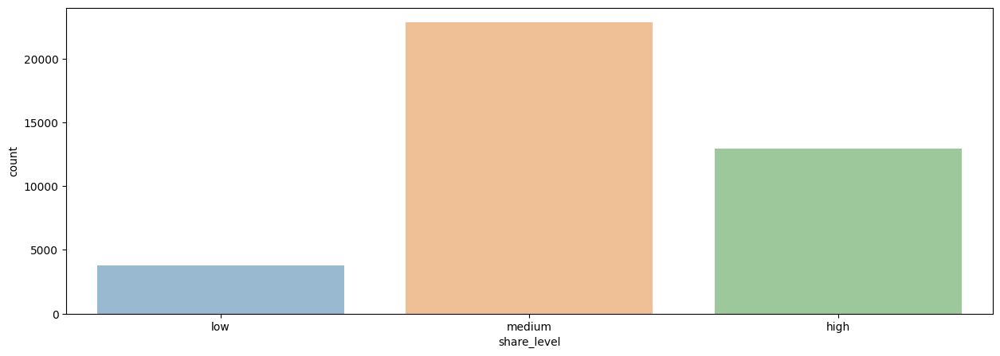

In [11]:
# Evaluating features (sensors) contribution towards the label
fig = plt.figure(figsize=(15,5))
ax = sns.countplot(x='share_level',data=data,alpha=0.5)

In [12]:
# Fetch the counts for each class
class_counts = data.groupby('share_level').size().reset_index()
class_counts.columns = ['Share Level','No of articles']
class_counts

,Share Level,No of articles
0,high,12955
1,low,3802
2,medium,22887


## Data Visualization 
Evaluating our hypothesis

In [13]:
# Visualizaing the "low" expectation hypothesis
# n_non_stop_words
print(data['n_non_stop_words'].describe())
# Comment - Visualizing the n_non_stop_words data field shows that the present of a record with 1042 value, 
# futher observation of that data shows that it belongs to entertainment which is not actually. It belongs to world news or others.
# this particluar also contains 0 on a lot of attributes. This record is classifed as a noise and will be remove.
data = data[data['n_non_stop_words'] != 1042]
# Here, we will go ahead and drop the field of ' n_non_stop_words'
data.drop(labels=['n_non_stop_words'], axis = 1, inplace=True)

count    39644.000000
mean         0.996469
std          5.231231
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max       1042.000000
Name: n_non_stop_words, dtype: float64


### Noise Removal
 - We noticed some irregularities in the dataset arising from various attributes.

In [14]:
# remove noise from n_tokens_content. those equals to 0
data  = data[data['n_tokens_content'] != 0]
print ("After noise removal - ",data.shape)

After noise removal -  (38462, 48)


<Axes: xlabel='share_level', ylabel='n_non_stop_unique_tokens'>

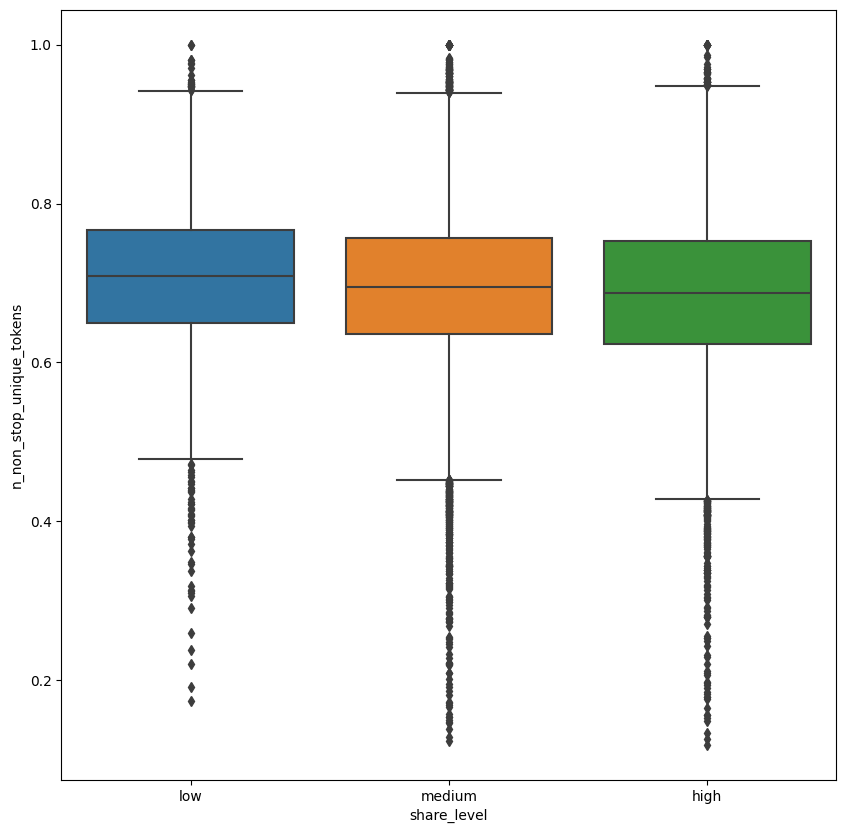

In [15]:
# n_non_stop_unique_tokens
data['n_non_stop_unique_tokens'].describe()
# a lot of unique words, it is better to use a different plot from bar plots
# line plot
temp_data = data[data['shares'] <= 100000]
fig, axes = plt.subplots(figsize=(10,10))
# box plot
sns.boxplot(x='share_level', y='n_non_stop_unique_tokens', data=data, ax=axes)

In [16]:
#kw_min_min and related kw_ terms
data['kw_min_min'].describe()
temp_data = data[data['shares'] <= 100000]
# running a pair plot for the kw__terms
kw_cols = ['kw_min_min', 'kw_max_min', 'kw_avg_min', 'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 
            'kw_max_avg', 'kw_avg_avg', 'shares']

'There is a linear relationship between rate_positive_words and rate_negative_words (it is expected)\nrate_positive_words = No special relationship or observable trait was observed for this variable. Although most of articles tends \nto be on falls towards the 0.3 - 1\nrate_negative_words = No special relationship or observable trait was observed for this variable. Although most of articles tends \nto be on falls towards the 0.8 - 0 = Note the articles with popularity less than "average" have the lowest negative score rate.\nglobal_rate_positive_words - There is a slight relationship with shares. - Medium\nglobal_rate_negative_words - There is a slight relationship with shares. - Medium'

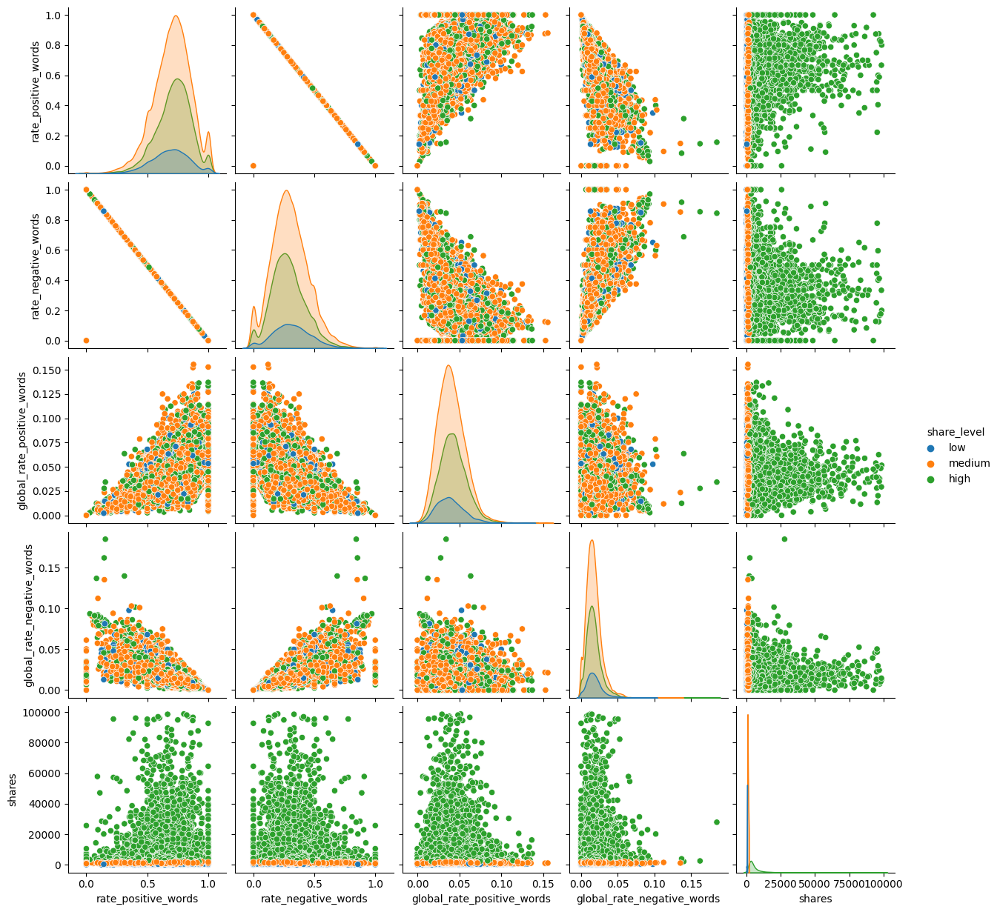

In [17]:
#Finding relationship between 'rate_positive_words', 'rate_negative_words', 'global_rate_positive_words', 'global_rate_negative_words', and 'shares'
temp_data = data[data['shares'] <= 100000]
# running a pair plot for the these terms
kw_cols = ['rate_positive_words', 'rate_negative_words', 'global_rate_positive_words', 'global_rate_negative_words', 'shares']
# run a pairplot
sns.pairplot(temp_data, vars=kw_cols, hue='share_level', diag_kind='kde')
'''There is a linear relationship between rate_positive_words and rate_negative_words (it is expected)
rate_positive_words = No special relationship or observable trait was observed for this variable. Although most of articles tends 
to be on falls towards the 0.3 - 1
rate_negative_words = No special relationship or observable trait was observed for this variable. Although most of articles tends 
to be on falls towards the 0.8 - 0 = Note the articles with popularity less than "average" have the lowest negative score rate.
global_rate_positive_words - There is a slight relationship with shares. - Medium
global_rate_negative_words - There is a slight relationship with shares. - Medium'''

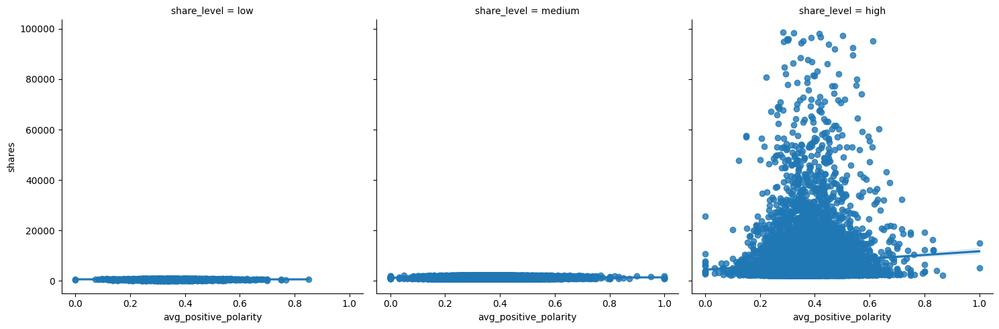

In [18]:
# attempt polartiy
temp_data = data[data['shares'] <= 100000]
sns.lmplot(x='avg_positive_polarity', y='shares', col='share_level', data=temp_data)

<Axes: xlabel='avg_positive_polarity', ylabel='shares'>

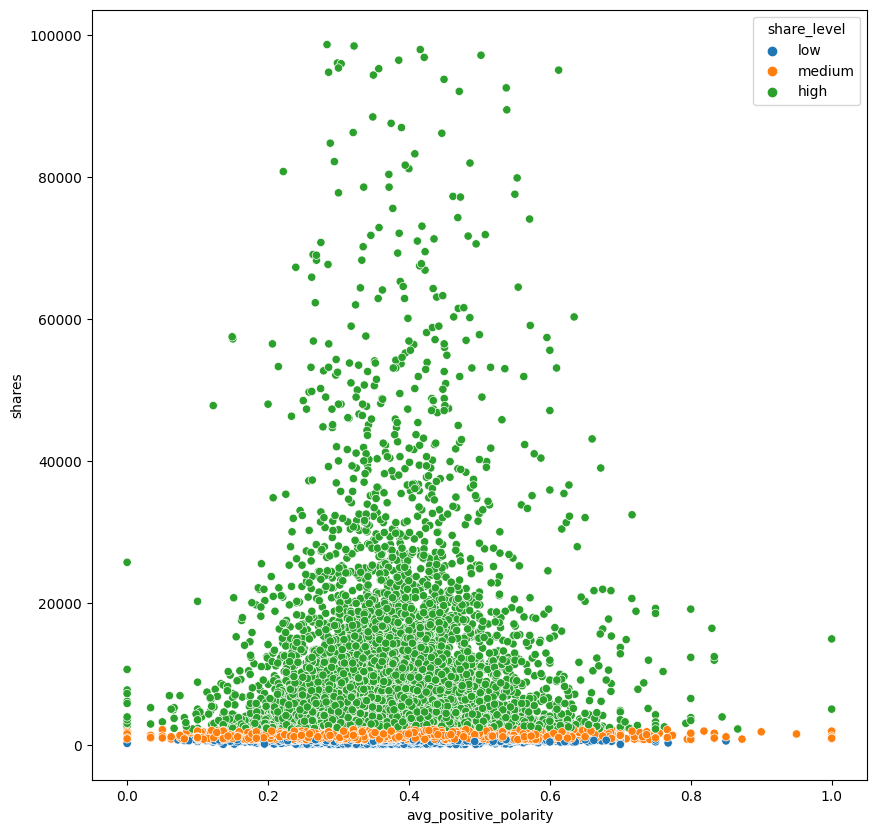

In [19]:
# attempt polartiy
temp_data = data[data['shares'] <= 100000]
fig, axes = plt.subplots(figsize=(10,10))
sns.scatterplot(x='avg_positive_polarity', y='shares', hue='share_level', data=temp_data, ax=axes)

'avg_positive_polarity and avg_negative_polarity are good features with some clear observation'

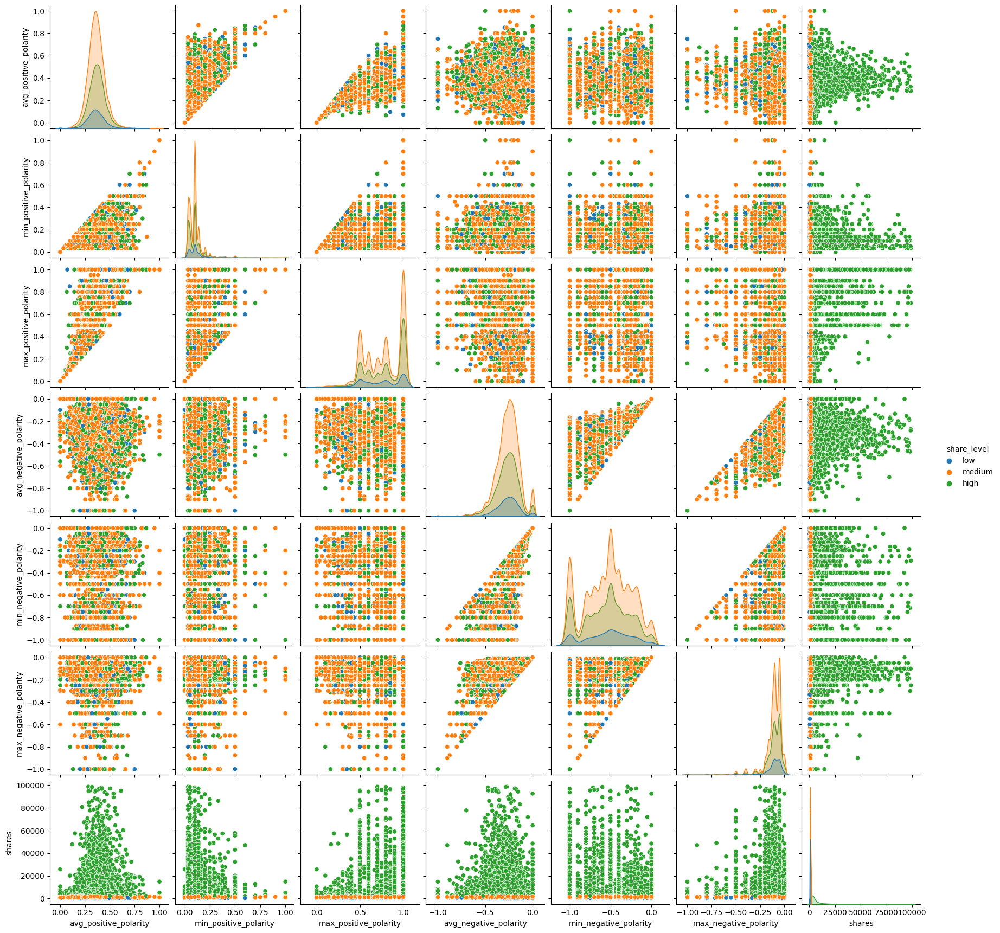

In [20]:
#Finding relationship between 'rate_positive_words', 'rate_negative_words', 'global_rate_positive_words', 'global_rate_negative_words', and 'shares'
temp_data = data[data['shares'] <= 100000]
# running a pair plot for the terms
kw_cols = ['avg_positive_polarity', 'min_positive_polarity', 'max_positive_polarity', 'avg_negative_polarity', 'min_negative_polarity', 'max_negative_polarity', 'shares']
# run a pairplot
sns.pairplot(temp_data, vars=kw_cols, hue='share_level', diag_kind='kde')
'''avg_positive_polarity and avg_negative_polarity are good features with some clear observation'''

<Axes: xlabel='title_sentiment_polarity', ylabel='shares'>

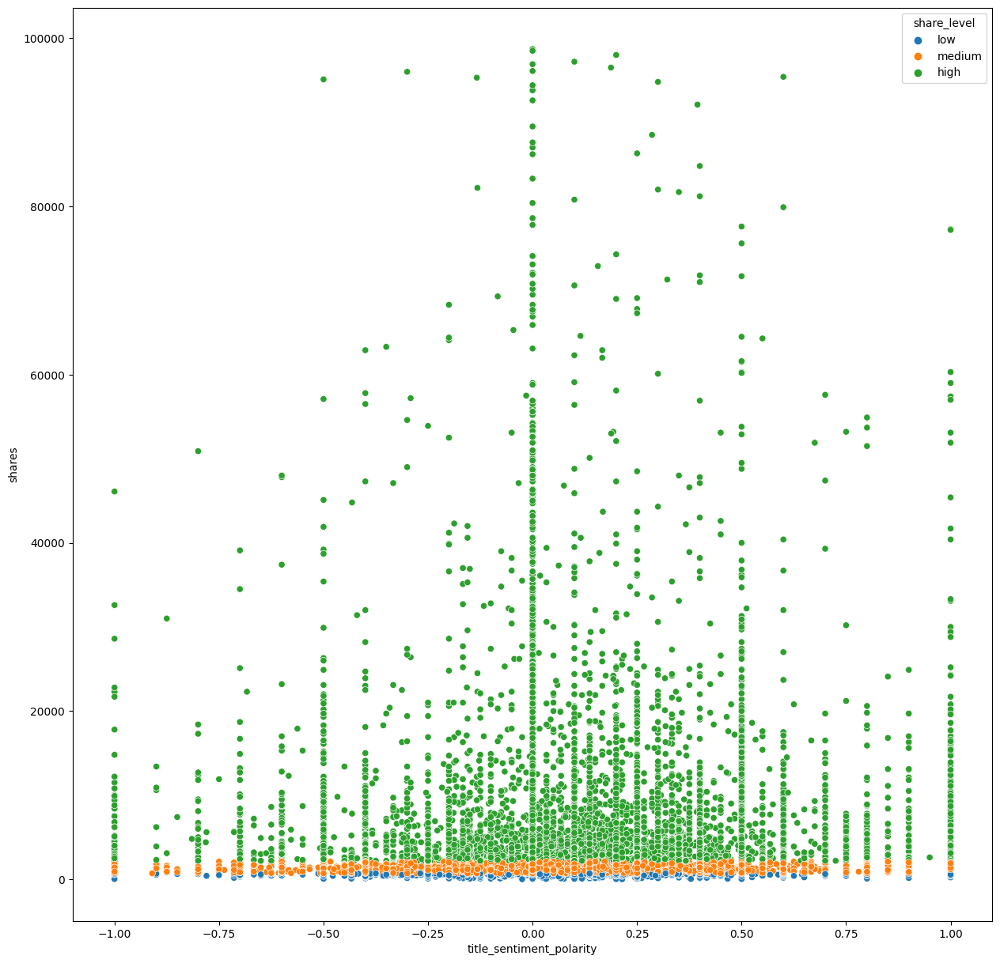

In [21]:
# attempt title_subjectivity
temp_data = data[data['shares'] <= 100000]
fig, axes = plt.subplots(figsize=(15,15))
sns.scatterplot(x='title_sentiment_polarity', y='shares', hue='share_level', data=temp_data, ax=axes)

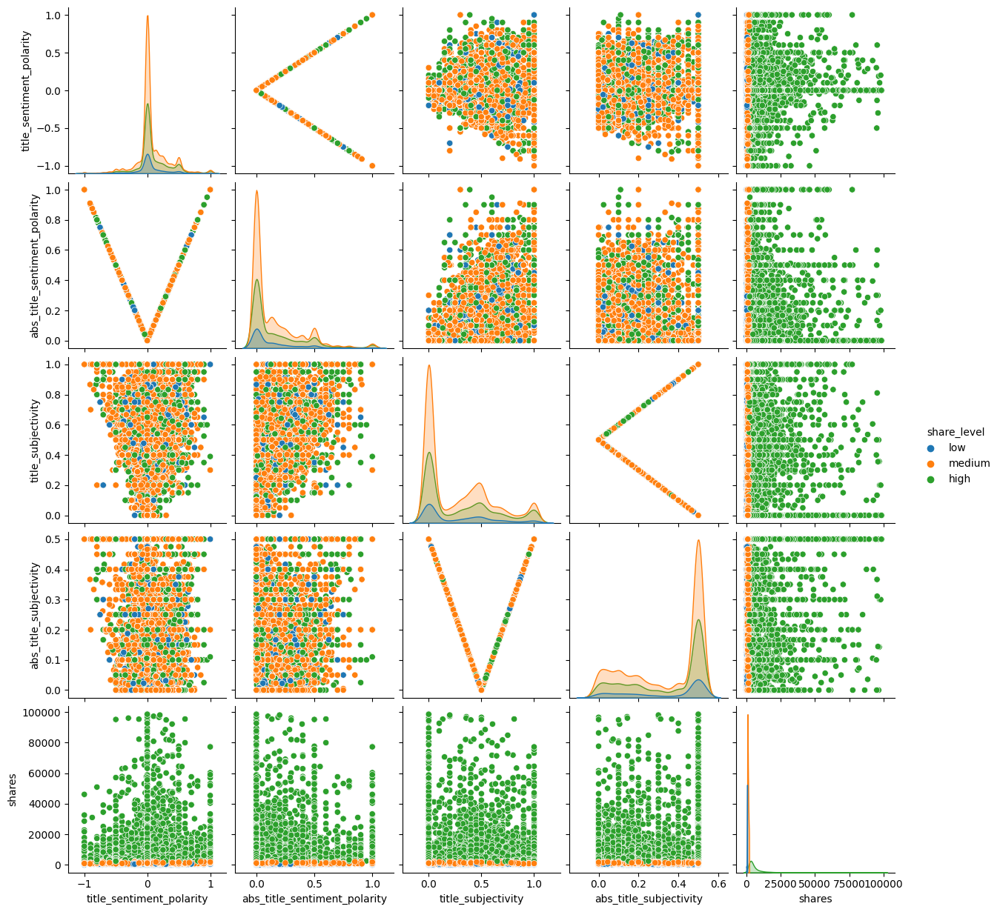

In [22]:
temp_data = data[data['shares'] <= 100000]
# running a pair plot for the kw__terms
kw_cols = ['title_sentiment_polarity', 'abs_title_sentiment_polarity', 'title_subjectivity', 'abs_title_subjectivity', 'shares']
# run a pairplot
sns.pairplot(temp_data, vars=kw_cols, hue='share_level', diag_kind='kde')

### Evaluating Expectations

<Axes: xlabel='self_reference_min_shares', ylabel='shares'>

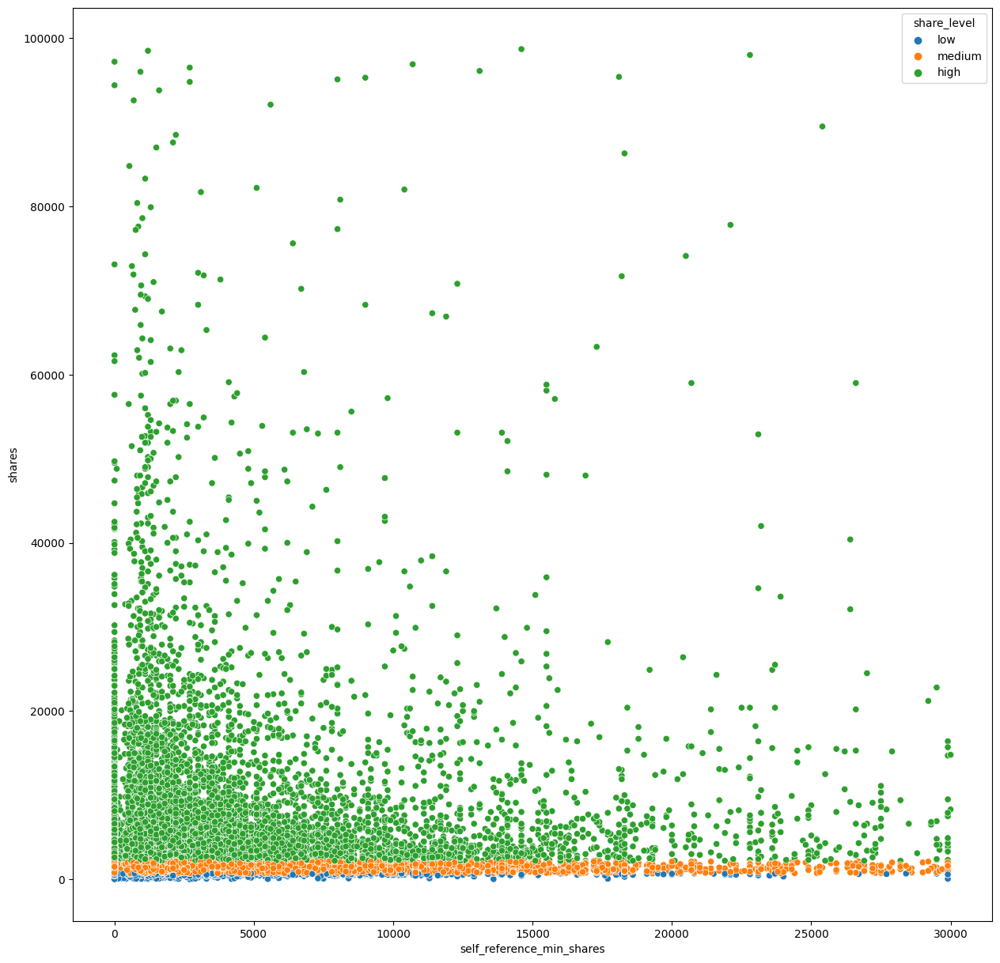

In [23]:
# attempt self_reference_min_shares
temp_data = data[(data['shares'] <= 100000) & (data['self_reference_min_shares'] <= 30000)]
fig, axes = plt.subplots(figsize=(15,15))
sns.scatterplot(x='self_reference_min_shares', y='shares', hue= 'share_level', data=temp_data, ax=axes)

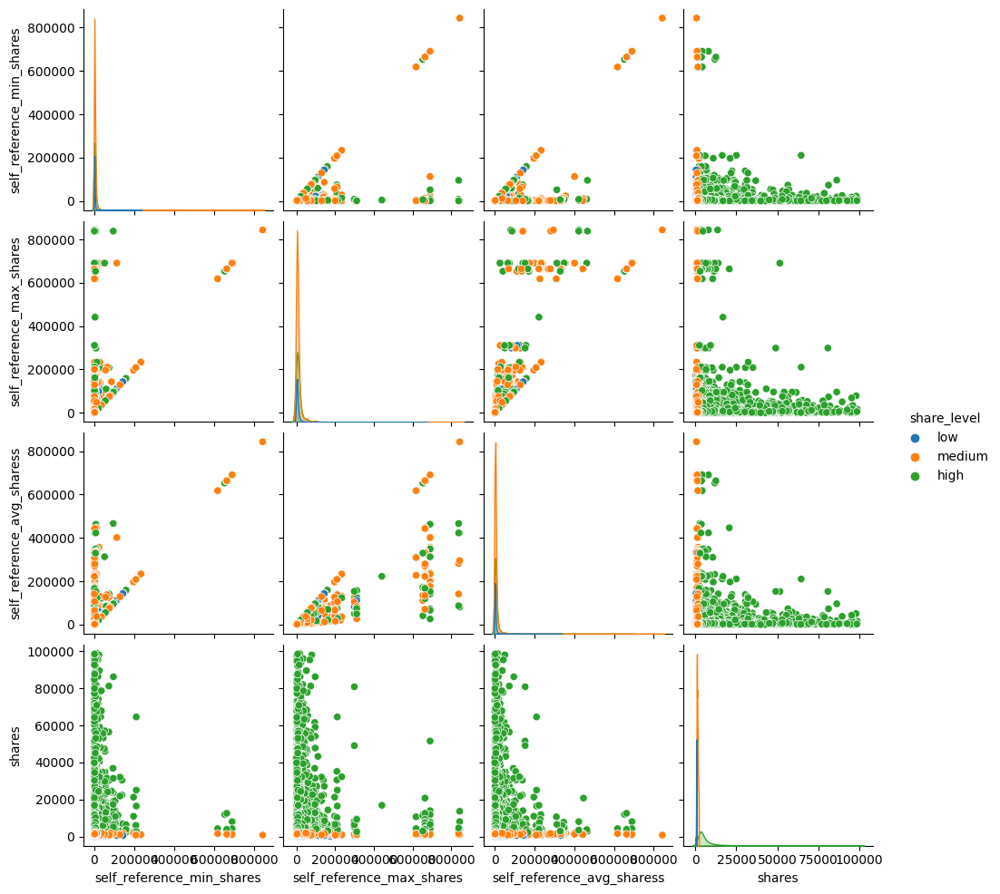

In [24]:
temp_data = data[data['shares'] <= 100000]
# running a pair plot for the kw__terms
kw_cols = ['self_reference_min_shares', 'self_reference_max_shares', 'self_reference_avg_sharess', 'shares']
# run a pairplot
sns.pairplot(temp_data, vars=kw_cols, hue='share_level', diag_kind='kde')

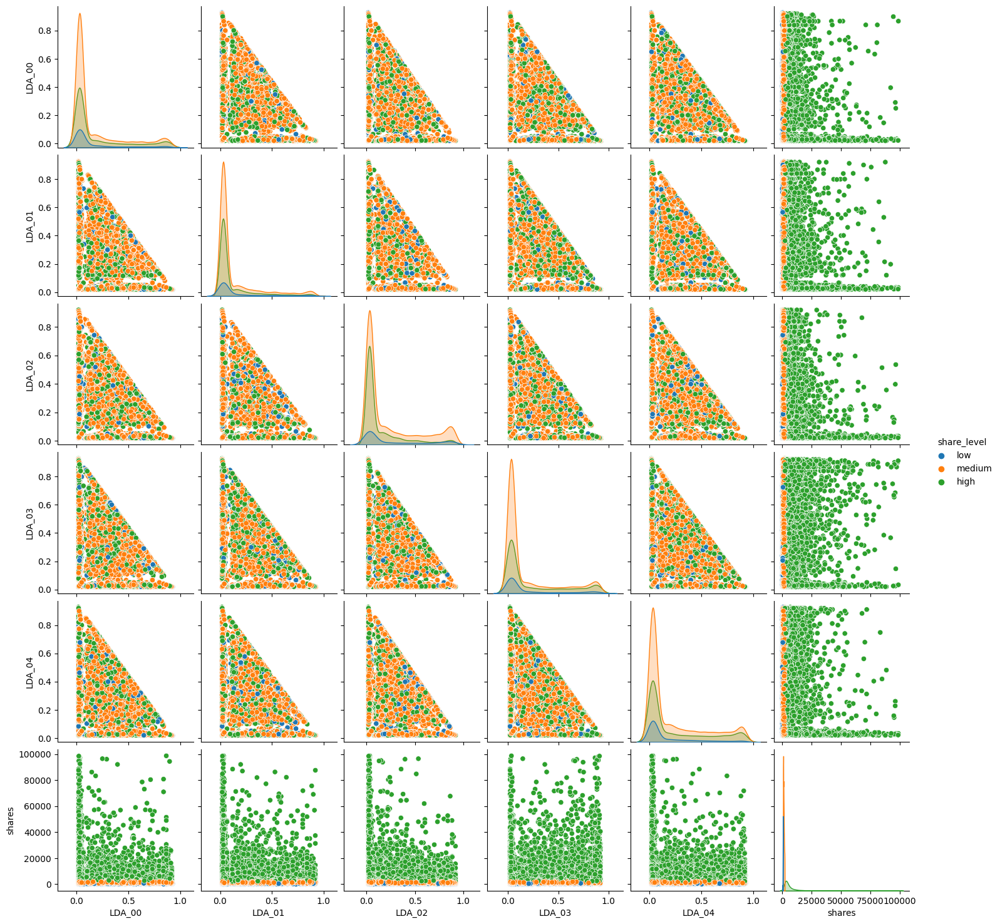

In [25]:
#### LDA - 0: 5
temp_data = data[data['shares'] <= 100000]
# running a pair plot for the kw__terms
kw_cols = ['LDA_00', 'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'shares']
# run a pairplot
sns.pairplot(temp_data, vars=kw_cols, hue='share_level', diag_kind='kde')

### Weekdays Variable Effect

In [26]:
# extact the weekdays articles distrubution
weekdays_data = data.groupby('weekdays').size().reset_index()
weekdays_data.columns = ['weekdays','count']
weekdays_data

,weekdays,count
0,Friday,5538
1,Monday,6471
2,Saturday,2369
3,Sunday,2657
4,Thursday,7052
5,Tueday,7170
6,Wednesday,7205


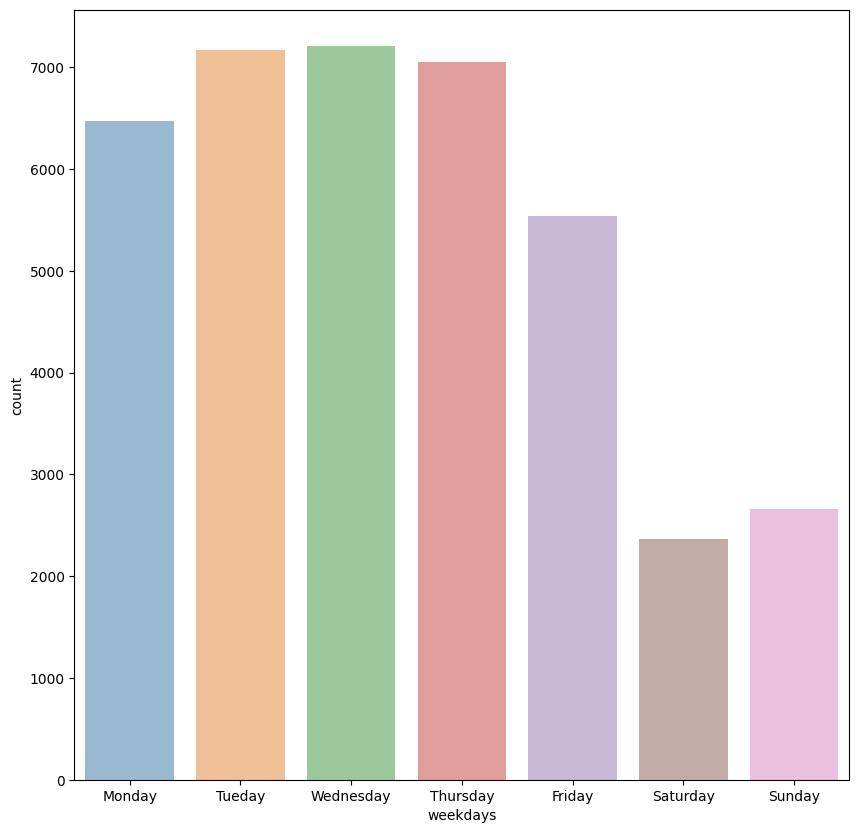

In [27]:
# shows the days when articles are usually posted
fig, axes = plt.subplots(figsize=(10,10))
ax = sns.countplot(x='weekdays',data=data,alpha=0.5, ax=axes)

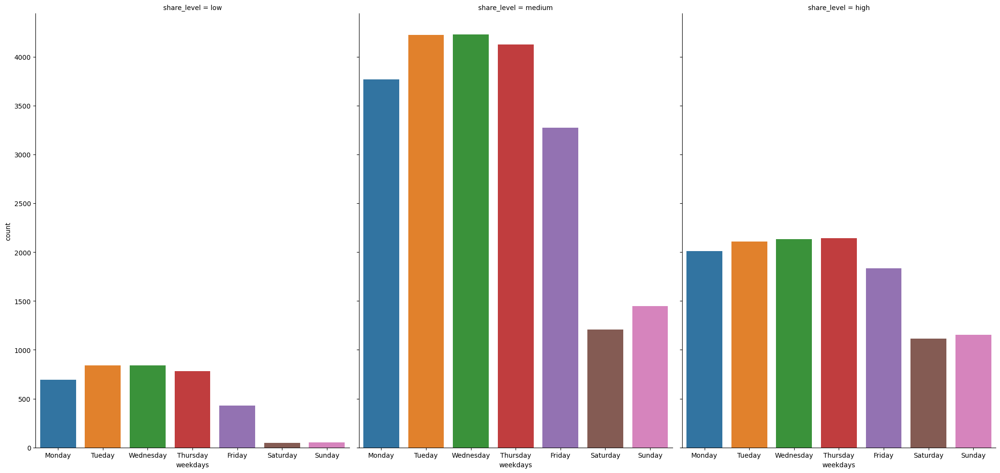

In [28]:
# shows relationship with the number of shares and the weekdays
temp_data = data[(data['share_level'] == 'low') | (data['share_level'] == 'medium') | (data['share_level'] == 'high')]
ax = sns.catplot(x='weekdays', col="share_level", data=temp_data, kind="count", height=10, aspect=.7)

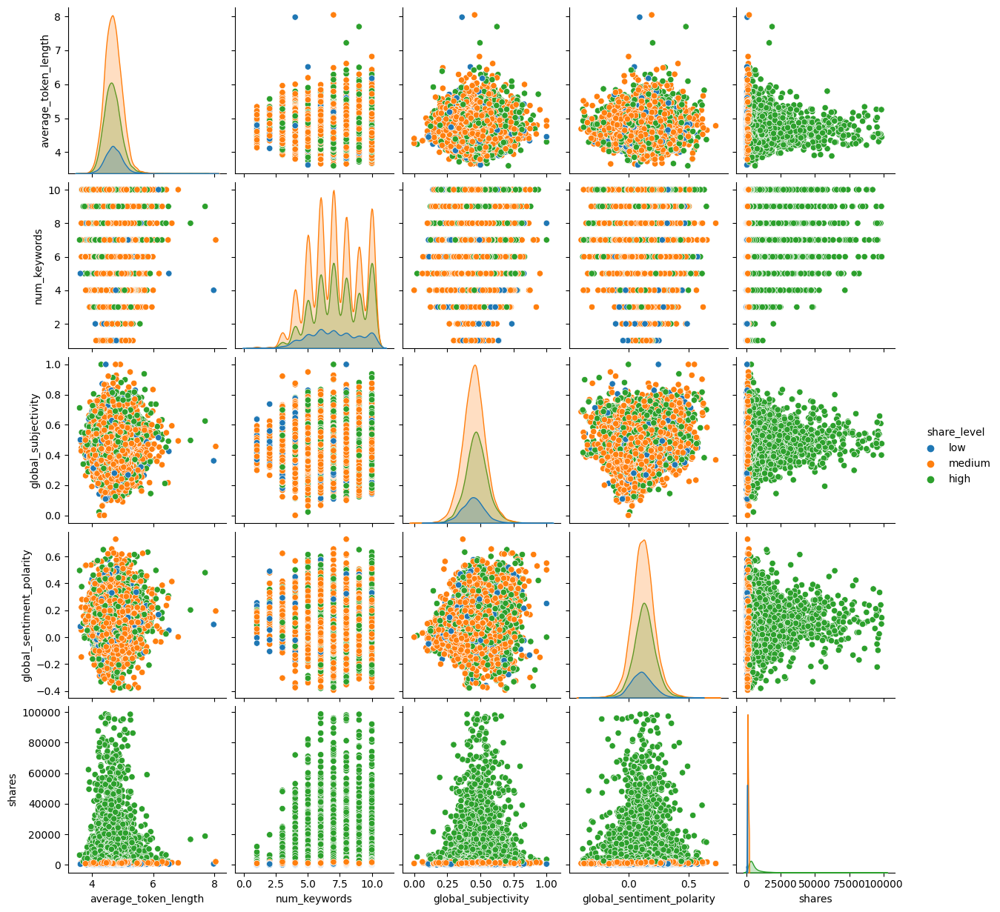

In [29]:
temp_data = data[data['shares'] <= 100000]
# running a pair plot for the kw__terms
kw_cols = ['average_token_length', 'num_keywords', 'global_subjectivity', 'global_sentiment_polarity', 'shares']
# run a pairplot
sns.pairplot(temp_data, vars=kw_cols, hue='share_level', diag_kind='kde')

### Data Channel Evaluation
In this analysis, it's evident that articles in the "Others" channel hold the top spot in terms of share level. When focusing on more specific channels, "Business" and "Entertainment" channels are prominent for achieving high. Following them are the "World" and "Tech" channels, occupying the third position. Generally, Tech channels have an average performance. A notable observation is the consistent presence of "Entertainment" channel articles across all levels of share level, indicating that they might not always be the most reliable channel for publishing.

In [30]:
## Seeing the distribution of the articles across the data channels
# extact the weekdays articles distrubution
data_channel_data = data.groupby('data_channel').size().reset_index()
data_channel_data.columns = ['Data Channels','No of articles']
data_channel_data

,Data Channels,No of articles
0,Business,6235
1,Entertainment,6855
2,Lifestyle,2077
3,Others,5491
4,Social Media,2311
5,Tech,7325
6,World,8168


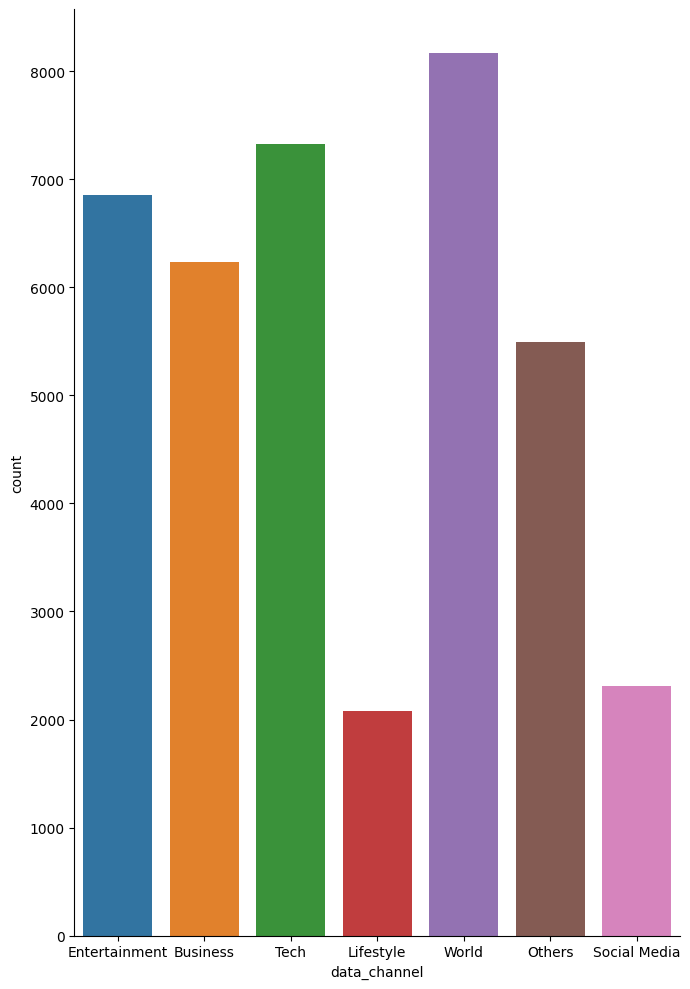

In [31]:
# Shows the distribution of the articles across the channels
sns.catplot(x='data_channel', data=data, kind="count", height=10, aspect=.7)

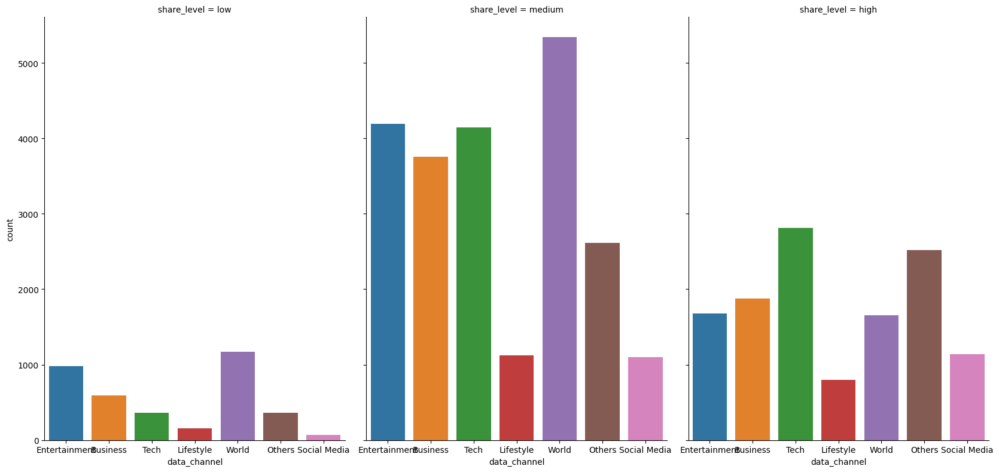

In [32]:
#the ranking of the channels in regards to the shares popularity
temp_data = data[(data['share_level'] == 'low') | (data['share_level'] == 'medium') | (data['share_level'] == 'high')]
ax = sns.catplot(x='data_channel', col="share_level", data=temp_data, kind="count", height=8, aspect=.7)

### Evaluating the Observerd Hypothesis

#### Data channels vs Num_images vs share level
In this analysis, we examined the relationship between the number of images in articles and their share level, across different data channels.
Previously, we noted that articles considered to be of good quality often feature a high number of images, but this isn't a universal rule.
A notable exception to this trend is observed in the Business channel. According to the provided plot, the number of images in Business channel articles doesn't significantly impact their share level. These articles typically have a low number of images, regardless of how level they are, which is an interesting pattern.
On the other hand, articles in the Entertainment channel usually show an increase in the number of images as their level grows. The only deviation from this trend is seen in articles with 'Medium' level.

<Axes: xlabel='share_level', ylabel='num_imgs'>

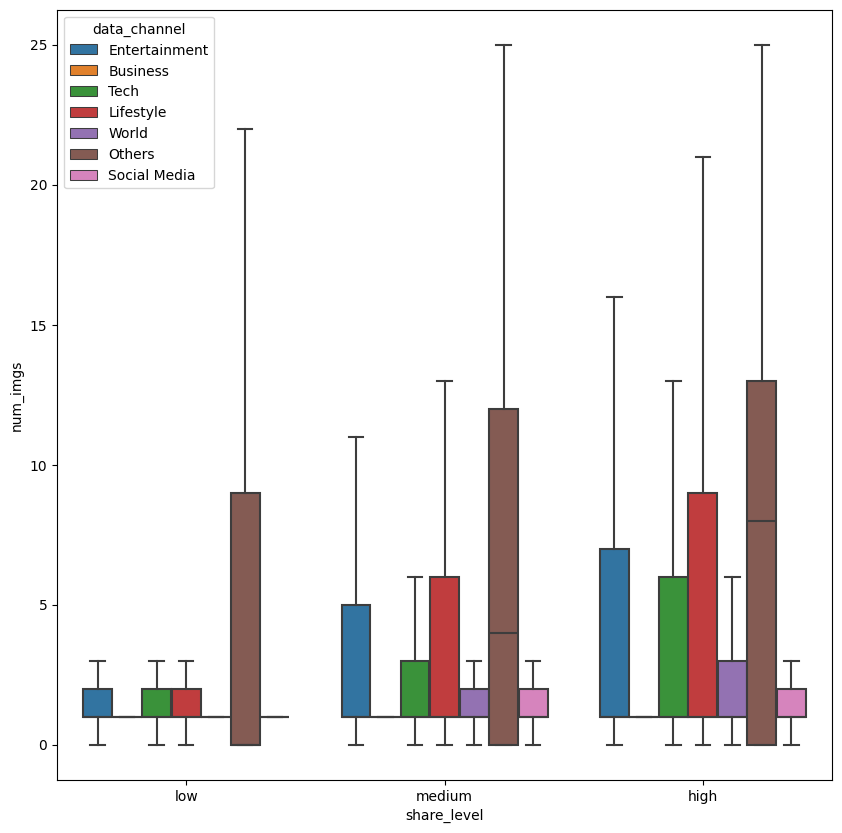

In [33]:
fig,ax = plt.subplots(figsize=(10,10))
temp_data = data[data['num_imgs'] <= 25]
sns.boxplot(x='share_level',y='num_imgs', hue='data_channel', data=temp_data, showfliers=False)

## Remove 'shares' column

In [34]:
# Remove the original 'shares' column to avoid collinearity
data = data.drop('shares', axis=1)
print(data.head())

   n_tokens_title  n_tokens_content  n_unique_tokens  \
0            12.0             219.0         0.663594   
1             9.0             255.0         0.604743   
2             9.0             211.0         0.575130   
3             9.0             531.0         0.503788   
4            13.0            1072.0         0.415646   

   n_non_stop_unique_tokens  num_hrefs  num_self_hrefs  num_imgs  num_videos  \
0                  0.815385        4.0             2.0       1.0         0.0   
1                  0.791946        3.0             1.0       1.0         0.0   
2                  0.663866        3.0             1.0       1.0         0.0   
3                  0.665635        9.0             0.0       1.0         0.0   
4                  0.540890       19.0            19.0      20.0         0.0   

   average_token_length  num_keywords  ... min_positive_polarity  \
0              4.680365           5.0  ...              0.100000   
1              4.913725           4.0  ...    

# 3. Prepped Data Review

In [35]:
# Analyzing the distribution of the 'share_level' variable
print("Distribution of 'share_level' categories:")
print(data['share_level'].value_counts())

Distribution of 'share_level' categories:
share_level
medium    22277
high      12495
low        3690
Name: count, dtype: int64


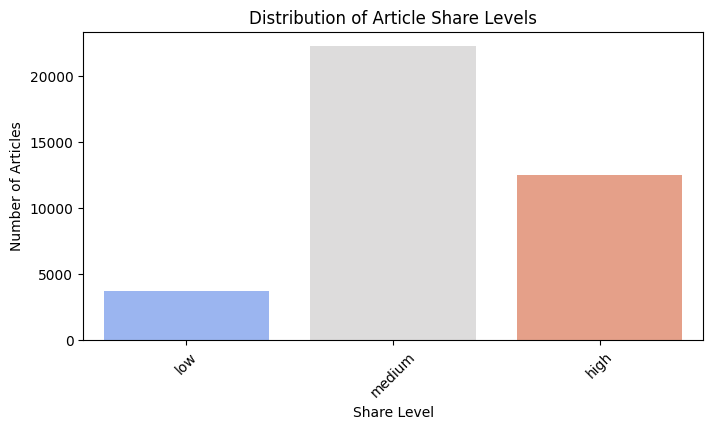

In [36]:
# Visual representation of the 'share_level' distribution
plt.figure(figsize=(8, 4))
sns.countplot(x='share_level', data=data, palette='coolwarm')
plt.title('Distribution of Article Share Levels')
plt.xlabel('Share Level')
plt.ylabel('Number of Articles')
plt.xticks(rotation=45)
plt.show()

In [37]:
# Check for any anomalies or unexpected distributions
if data['share_level'].isnull().any():
    print("There are missing values in 'share_level'.")
else:
    print("No missing values in 'share_level'.")

No missing values in 'share_level'.


### Analysis of share_level Distribution
1. Skewed Distribution:
The distribution of the share_level categories is clearly skewed. The 'Medium' category contains the majority of the articles, while the 'Low' category has significantly fewer articles compared to the other two. This imbalance could affect the performance of machine learning models, particularly those sensitive to class imbalance like neural networks.

2. Potential Model Bias:
Models trained on this data might develop a bias toward predicting the 'Medium' and 'High' categories more accurately than the 'Low' category, as they have more examples to learn from.

3. Mitigation Strategies:
To address this imbalance and prevent model bias, you might consider:
* Resampling Techniques: Either by oversampling the 'Low' category or undersampling the 'Medium' category to balance the dataset.
* Adjusting Class Weights: Modifying the loss function to penalize misclassifications of the 'Low' category more than those of the more frequent categories. This can help in improving model fairness and predictive performance across categories.
* Anomaly Detection Techniques: Given the small size of the 'Low' category, treating it as an anomaly might yield interesting insights, depending on the business context or the specific analytical goals.

## Making Recommendations For Good Articles
- Keep n_tokens_content under 1500 words; shorter is generally better.
- n_tokens_title should range from 6 to 17 words.
- Aim for n_unique_tokens to be between 0.3 and 0.8.
- Include 1 to 40 external links (num_hrefs).
- Have 1 to 40 images (num_imgs) in the article.
- Limit num_videos to 0 - 25, as more videos can decrease the odds of popularity.
- Ensure the average_token_length stays within 4 to 6 characters.
- Having more keywords in the metadata significantly boosts share potential. Ideally, have more than 5 keywords.
- Articles in the "Others" channel often see the highest share popularity, followed by those in "Business" and - - - "Entertainment" channels. "World" and "Tech" channels are also good choices, ranking third.
- Articles posted on Mondays and Wednesdays (including some Tuesdays) tend to be more popular, while weekends, - - - especially Sundays and Saturdays, are the least effective days for publishing.
- Content discussing current trends tends to garner more shares.

> > The scatterplot indicates that articles of good quality typically have an n_tokens_content count between 100 and 2000 words.

# 4. Neural Network Modeling

## Feature Selection/Dimensionality Reduction
- We will be identifying the most effective features from the data, taking into account the following criteria:
  - Selecting features based on the strongest hypotheses observed.
  - Comprehensive feature selection across the entire dataset.
  - Applying Fisher's discriminant analysis for feature selection.
  - Choosing features based on the best hypotheses, but ensuring they conform to a normal distribution through log transformation.
  - Utilizing Fisher's discriminant analysis on a dataset that has been normalized.
  - Complete feature selection across the entire dataset, focusing on those that exhibit a normal distribution.

#### Feature Selection on the whole dataset

In [39]:
training_set = data.iloc[:, :(data.shape[1]-1)]
# convert categorical variables into dummy - it use one-hot encoding
training_set = pd.get_dummies(training_set)

# extract the label data in this case popularity
label_set = data.iloc[:, (data.shape[1]-1):].values

data_feature2 = copy(training_set)

#### Feature selection based on best hypothesis observed

In [40]:
# only the best observed features are extracted here
data_feature1 =training_set[['n_tokens_title','n_tokens_content','n_unique_tokens','num_hrefs',
                       'num_self_hrefs','num_imgs','num_videos','average_token_length','num_keywords',
                       'kw_avg_avg','self_reference_avg_sharess','global_subjectivity',
                       'global_sentiment_polarity','global_rate_positive_words','global_rate_negative_words','avg_positive_polarity',
                       'avg_negative_polarity','title_sentiment_polarity','weekdays_Friday', 'weekdays_Monday', 'weekdays_Saturday',
       'weekdays_Sunday', 'weekdays_Thursday', 'weekdays_Tueday',
       'weekdays_Wednesday', 'data_channel_Business',
       'data_channel_Entertainment', 'data_channel_Lifestyle',
       'data_channel_Others', 'data_channel_Social Media', 'data_channel_Tech',
       'data_channel_World']]

In [41]:
data_feature1.columns

Index(['n_tokens_title', 'n_tokens_content', 'n_unique_tokens', 'num_hrefs',
       'num_self_hrefs', 'num_imgs', 'num_videos', 'average_token_length',
       'num_keywords', 'kw_avg_avg', 'self_reference_avg_sharess',
       'global_subjectivity', 'global_sentiment_polarity',
       'global_rate_positive_words', 'global_rate_negative_words',
       'avg_positive_polarity', 'avg_negative_polarity',
       'title_sentiment_polarity', 'weekdays_Friday', 'weekdays_Monday',
       'weekdays_Saturday', 'weekdays_Sunday', 'weekdays_Thursday',
       'weekdays_Tueday', 'weekdays_Wednesday', 'data_channel_Business',
       'data_channel_Entertainment', 'data_channel_Lifestyle',
       'data_channel_Others', 'data_channel_Social Media', 'data_channel_Tech',
       'data_channel_World'],
      dtype='object')

#### Feature Selection Based on Fisher Discrimating Analysis

In [42]:
# helper function for evalating the fisher ndex
def fisher_index_calc(trainingSet, labelSet):
    (dim1_T, dim2_T) = trainingSet.shape
    (dim1_L, dim2_L) = labelSet.shape

    # create the fisher output variable - A vector of all the features
    fisher_ratios = np.zeros((1, dim2_T), dtype=float).flatten()
    # It's expected that the dim1_T and dim1_L be of the same size, else this input parameters is nulled.
    if dim1_L != dim1_T:
        return fisher_ratios

    # First extract out the number of features available.
    # grouped both data together, and create a pandas dataframe from it.
    train1 = pd.DataFrame(trainingSet)
    label1 = pd.DataFrame(labelSet, columns=['LABEL'])
    grouped = pd.concat([train1, label1], axis=1)

    # fetch the number of classes
    (no_classes, demo) = grouped.groupby('LABEL').count()[[0]].shape
    #print grouped

    # loop through all features
    for j in range(dim2_T):
        # the variance of the feature j
        j_variance = np.var(trainingSet[:,j])
        j_mean = np.mean(trainingSet[:,j])
        j_summation = 0
        for k in range(no_classes):
            output = grouped.groupby('LABEL').count()[[j]]
            k_feature_count = output.iloc[k,0]
            # mean for class k of feature j
            output = grouped.groupby('LABEL').mean()[[j]]
            k_feature_mean = output.iloc[k,0]
            currentSum = k_feature_count * np.square((k_feature_mean - j_mean))
            j_summation = j_summation + currentSum
        fisher_ratios[j] = j_summation / np.square(j_variance)

    return fisher_ratios

In [43]:
# calculates the fisher score of the features
fisher_scores = fisher_index_calc(training_set.values, label_set)

df = pd.DataFrame({'Fisher Ratio For All Features': fisher_scores})

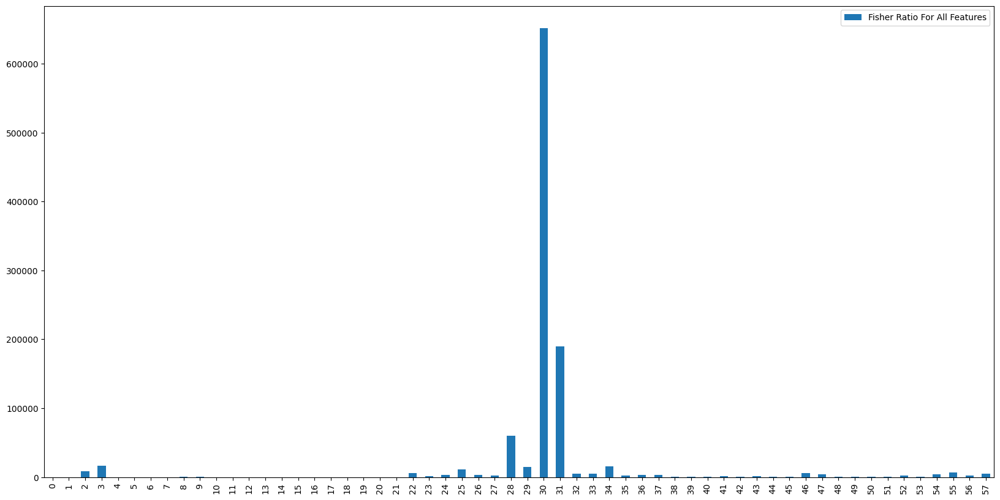

In [44]:
# plot the fisher analysis score
ax = df.plot.bar(figsize=(20,10))
plt.show()

In [45]:
# feature selection based on fisher score
# Fisher Index Ratio Filter - Remove features with low score
# indices of features to remove based on fisher ratios
to_remove = []
for i in range((len(fisher_scores))):
    if fisher_scores[i] < 3000:
        # we mark for removal
        to_remove.append(i)

# remove features with low fisher score
data_feature_fisher = training_set.drop(training_set.columns[to_remove], axis=1, inplace=False)
print ("fisher based features - ", data_feature_fisher.shape)
data_feature_fisher.columns

fisher based features -  (38462, 19)


Index(['n_unique_tokens', 'n_non_stop_unique_tokens', 'is_weekend', 'LDA_01',
       'LDA_02', 'LDA_03', 'global_subjectivity', 'global_sentiment_polarity',
       'global_rate_positive_words', 'global_rate_negative_words',
       'rate_positive_words', 'rate_negative_words', 'avg_positive_polarity',
       'avg_negative_polarity', 'weekdays_Saturday', 'weekdays_Sunday',
       'data_channel_Others', 'data_channel_Social Media',
       'data_channel_World'],
      dtype='object')

#### Finding the normal distrubution of the dataset

In [46]:
# use log transformation to transform each features to a normal distribution
training_set_normal = copy(training_set)

# note log transformation can only be performed on data without zero value
for col in training_set_normal.columns:
    #applying log transformation
    temp = training_set_normal[training_set_normal[col] == 0]
    # only apply to non-zero features
    if temp.shape[0] == 0:
        training_set_normal[col] = np.log(training_set_normal[col])
        print (col)
    else:
        # attempt to only transform the positive values alone
        training_set_normal.loc[training_set_normal[col] > 0, col] = np.log(training_set_normal.loc[training_set_normal[col] > 0, col])

n_tokens_title
n_tokens_content
n_unique_tokens
n_non_stop_unique_tokens
average_token_length
num_keywords
LDA_00
LDA_01
LDA_02
LDA_03
LDA_04


#### Feature selection based on best hypothesis observed - Normal distribution

In [47]:
# only the best observed features are extracted here
data_feature1_normal =training_set_normal[['n_tokens_title','n_tokens_content','n_unique_tokens','num_hrefs',
                       'num_self_hrefs','num_imgs','num_videos','average_token_length','num_keywords',
                       'kw_avg_avg','self_reference_avg_sharess','global_subjectivity',
                       'global_sentiment_polarity','global_rate_positive_words','global_rate_negative_words','avg_positive_polarity',
                       'avg_negative_polarity','title_sentiment_polarity','weekdays_Friday', 'weekdays_Monday', 'weekdays_Saturday',
       'weekdays_Sunday', 'weekdays_Thursday', 'weekdays_Tueday',
       'weekdays_Wednesday', 'data_channel_Business',
       'data_channel_Entertainment', 'data_channel_Lifestyle',
       'data_channel_Others', 'data_channel_Social Media', 'data_channel_Tech',
       'data_channel_World']]

#### Feature Selection Based on Fisher Discrimating Analysis - Normal Distribution

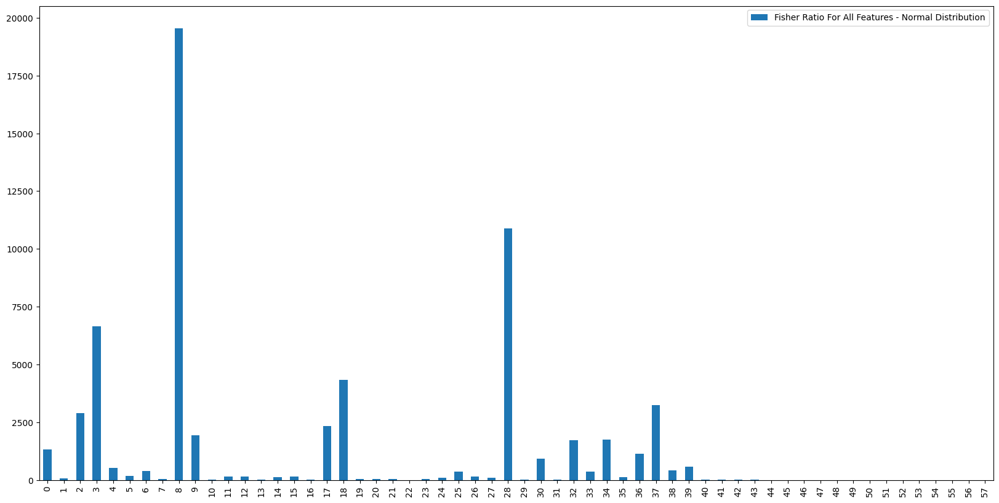

In [48]:
# calculates the fisher score of the features
fisher_scores_normal = fisher_index_calc(training_set_normal.values, label_set)

df = pd.DataFrame({'Fisher Ratio For All Features - Normal Distribution': fisher_scores_normal})
# plot the fisher analysis score
ax = df.plot.bar(figsize=(20,10))
plt.show()

In [49]:
# feature selection based on fisher score
# Fisher Index Ratio Filter - Remove features with low score
# indices of features to remove based on fisher ratios
to_remove = []
for i in range((len(fisher_scores_normal))):
    if fisher_scores_normal[i] < 1000:
        # we mark for removal
        to_remove.append(i)

# remove features with low fisher score
data_feature_fisher_normal = training_set_normal.drop(training_set_normal.columns[to_remove], axis=1, inplace=False)
# ihave about 25 features left.
print ("fisher based features : Normal distributions - ", data_feature_fisher_normal.shape)
data_feature_fisher_normal.columns

fisher based features : Normal distributions -  (38462, 27)


Index(['n_tokens_title', 'n_unique_tokens', 'n_non_stop_unique_tokens',
       'average_token_length', 'num_keywords', 'kw_max_avg', 'kw_avg_avg',
       'is_weekend', 'global_subjectivity', 'rate_positive_words',
       'avg_positive_polarity', 'max_positive_polarity',
       'avg_negative_polarity', 'weekdays_Friday', 'weekdays_Monday',
       'weekdays_Saturday', 'weekdays_Sunday', 'weekdays_Thursday',
       'weekdays_Tueday', 'weekdays_Wednesday', 'data_channel_Business',
       'data_channel_Entertainment', 'data_channel_Lifestyle',
       'data_channel_Others', 'data_channel_Social Media', 'data_channel_Tech',
       'data_channel_World'],
      dtype='object')

#### Feature Selection on the whole dataset - Normal Distribution

In [50]:
data_feature2_normal = copy(training_set_normal)

### Variables of our features selection are listed below:
 - Feature selection based on best hypothesis observed - **data_feature1**
 - Feature Selection on the whole dataset - **data_feature2**
 - Feature selection using fisher discriminal analysis - **data_feature_fisher**
 - Feature selection based on the best hypothesis observed but with a normal distribution (log transformation) - **data_feature1_normal**
 - Feature selection using fisher discriminate analysis on normal distribution dataset - **data_feature_fisher_normal**
 - Feature Selection on the whole dataset - **data_feature2_normal** 

## Model Building
 - Here, we are going to apply some machine learing models on our dataset for classifying an article

In [51]:
# normalizaling the data with standard scaler
# we will normalized all the features selections

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# scalled all the feature selections
data_feature1_nor = scaler.fit_transform(data_feature1.values)
data_feature2_nor = scaler.fit_transform(data_feature2.values)
data_feature_fisher_nor = scaler.fit_transform(data_feature_fisher.values)
data_feature1_normal_nor = scaler.fit_transform(data_feature1_normal.values)
data_feature_fisher_normal_nor = scaler.fit_transform(data_feature_fisher_normal.values)
data_feature2_normal_nor = scaler.fit_transform(data_feature2_normal.values)

features_selection = [data_feature1_nor, data_feature2_nor, data_feature_fisher_nor, data_feature1_normal_nor, 
                     data_feature_fisher_normal_nor, data_feature2_normal_nor]

features_selection_labels = ['Features on Hypothesis', 'All Features', 'Fisher based Features', 
                             'Features on Hypothesis - Normal Distribution', 'Fisher based Features - Normal Distribution',
                             'All Features - Normal Distribution']

In [52]:
data.head(n=5)

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,share_level
0,12.0,219.0,0.663594,0.815385,4.0,2.0,1.0,0.0,4.680365,5.0,...,0.100000,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,low
1,9.0,255.0,0.604743,0.791946,3.0,1.0,1.0,0.0,4.913725,4.0,...,0.033333,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,medium
2,9.0,211.0,0.575130,0.663866,3.0,1.0,1.0,0.0,4.393365,6.0,...,0.100000,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,medium
3,9.0,531.0,0.503788,0.665635,9.0,0.0,1.0,0.0,4.404896,7.0,...,0.136364,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,medium
4,13.0,1072.0,0.415646,0.540890,19.0,19.0,20.0,0.0,4.682836,7.0,...,0.033333,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,low


In [53]:
# encoding the label set with a label encoder
from sklearn.preprocessing import LabelEncoder

labelEn = LabelEncoder()
encoded_labels = labelEn.fit_transform(data.loc[:, 'share_level'].values)
class_names = labelEn.classes_
class_names

array(['high', 'low', 'medium'], dtype=object)

In [54]:
# Splitting the data for Training and Testing
from sklearn.model_selection import train_test_split, GridSearchCV

# train and test for a feature selections
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(data_feature1_nor, encoded_labels, test_size=0.3, shuffle=False)
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(data_feature2_nor, encoded_labels, test_size=0.3, shuffle=False)
X_train_3, X_test_3, y_train_3, y_test_3 = train_test_split(data_feature_fisher_nor, encoded_labels, test_size=0.3, shuffle=False)
X_train_4, X_test_4, y_train_4, y_test_4 = train_test_split(data_feature1_normal_nor, encoded_labels, test_size=0.3, shuffle=False)
X_train_5, X_test_5, y_train_5, y_test_5 = train_test_split(data_feature_fisher_normal_nor, encoded_labels, test_size=0.3, shuffle=False)
X_train_6, X_test_6, y_train_6, y_test_6 = train_test_split(data_feature2_normal_nor, encoded_labels, test_size=0.3, shuffle=False)

In [55]:
from sklearn.metrics import accuracy_score, make_scorer

In [56]:
features_selection[4].shape

(38462, 27)

In [57]:
encoded_labels.shape

(38462,)

### Model Specifications
* Model 1: Use data_feature1_nor with a simple structure.
* Model 2: Use data_feature2_nor with a deeper network.
* Model 3: Use data_feature_fisher_nor with an even more complex structure and different learning rates.
* Model 4: Utilizing data_feature1_normal_nor
* Model 5: Utilizing data_feature_fisher_normal_nor
* Model 6: Utilizing data_feature2_normal_nor

### Tools and Libraries
We will use TensorFlow and Keras to construct these models, which are widely used for building neural networks due to their flexibility and user-friendly interface.

### Implementation
* Define the models: Setup neural network architectures.
* Compile the models: Specify the loss function and optimizer.
* Train the models: Fit models on training data and validate on test data.
* Evaluate: Compare the performance of each model based on accuracy and loss metrics.

In [59]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dropout

# Define the three models with varying architectures and hyperparameters
def create_model_1():
    model = Sequential([
        Dense(64, input_shape=(X_train_1.shape[1],), activation='relu'),
        Dense(32, activation='relu'),
        Dense(len(np.unique(y_train_1)), activation='softmax')
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

def create_model_2():
    model = Sequential([
        Dense(128, input_shape=(X_train_2.shape[1],), activation='relu'),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(len(np.unique(y_train_2)), activation='softmax')
    ])
    model.compile(optimizer=Adam(learning_rate=0.0005), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

def create_model_3():
    model = Sequential([
        Dense(256, input_shape=(X_train_3.shape[1],), activation='relu'),
        Dense(128, activation='relu'),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(len(np.unique(y_train_3)), activation='softmax')
    ])
    model.compile(optimizer=Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Model 4: data_feature1_normal_nor
def create_model_4():
    model = Sequential([
        Dense(128, input_shape=(X_train_4.shape[1],), activation='relu'),
        Dropout(0.2),
        Dense(64, activation='relu'),
        Dense(len(np.unique(y_train_4)), activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Model 5: data_feature_fisher_normal_nor
def create_model_5():
    model = Sequential([
        Dense(64, input_shape=(X_train_5.shape[1],), activation='tanh'),
        Dense(64, activation='tanh'),
        Dense(len(np.unique(y_train_5)), activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Model 6: data_feature2_normal_nor
def create_model_6():
    model = Sequential([
        Dense(256, input_shape=(X_train_6.shape[1],), activation='relu'),
        Dense(128, activation='relu'),
        Dropout(0.3),
        Dense(64, activation='relu'),
        Dense(len(np.unique(y_train_6)), activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Create and train the models
model_1 = create_model_1()
history_1 = model_1.fit(X_train_1, y_train_1, epochs=30, validation_data=(X_test_1, y_test_1))

model_2 = create_model_2()
history_2 = model_2.fit(X_train_2, y_train_2, epochs=30, validation_data=(X_test_2, y_test_2))

model_3 = create_model_3()
history_3 = model_3.fit(X_train_3, y_train_3, epochs=30, validation_data=(X_test_3, y_test_3))

model_4 = create_model_4()
history_4 = model_4.fit(X_train_4, y_train_4, epochs=30, validation_data=(X_test_4, y_test_4))

model_5 = create_model_5()
history_5 = model_5.fit(X_train_5, y_train_5, epochs=30, validation_data=(X_test_5, y_test_5))

model_6 = create_model_6()
history_6 = model_6.fit(X_train_6, y_train_6, epochs=30, validation_data=(X_test_6, y_test_6))

Epoch 1/30
842/842 ━━━━━━━━━━━━━━━━━━━━ 1s 336us/step - accuracy: 0.5407 - loss: 0.9338 - val_accuracy: 0.6306 - val_loss: 0.8257
Epoch 2/30
842/842 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - accuracy: 0.5875 - loss: 0.8587 - val_accuracy: 0.6406 - val_loss: 0.8130
Epoch 3/30
842/842 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - accuracy: 0.5914 - loss: 0.8516 - val_accuracy: 0.6433 - val_loss: 0.8070
Epoch 4/30
842/842 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - accuracy: 0.5980 - loss: 0.8436 - val_accuracy: 0.6389 - val_loss: 0.8145
Epoch 5/30
842/842 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - accuracy: 0.6047 - loss: 0.8339 - val_accuracy: 0.6319 - val_loss: 0.8168
Epoch 6/30
842/842 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - accuracy: 0.6114 - loss: 0.8304 - val_accuracy: 0.6423 - val_loss: 0.8073
Epoch 7/30
842/842 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - accuracy: 0.6072 - loss: 0.8279 - val_accuracy: 0.6368 - val_loss: 0.8134
Epoch 8/30
842/842 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - accuracy: 0.6184 - loss: 0.8174 - 

# 5. Model Evaluation & Select Model

## Model Selection Criteria
1. Accuracy: This is the most direct measure of how often the model is correct in the classification task.
2. Validation Loss: It helps determine how well the model is performing during training without overfitting. A model that shows minimal increase or a decrease in validation loss is generally preferable.
3. Generalization Ability: Assessed by the difference between training and validation performance. A smaller gap typically suggests better generalization.
4. Simplicity: Simpler models are generally preferred due to easier interpretability and lower computational cost. They are also less likely to overfit compared to more complex models.
5. Stability: Models that show less fluctuation in accuracy and loss across training epochs tend to be more stable and reliable.

## Evaluating Models
To systematically evaluate the models, we'll consider their performance metrics on both the training and validation datasets. Let's calculate and compare these metrics:
* Accuracy on both training and validation sets.
* Validation Loss to check for signs of overfitting.

In [60]:
# Example Python code to evaluate models
model_accuracies = {
    'model_1': history_1.history['val_accuracy'][-1],
    'model_2': history_2.history['val_accuracy'][-1],
    'model_3': history_3.history['val_accuracy'][-1],
    'model_4': history_4.history['val_accuracy'][-1],
    'model_5': history_5.history['val_accuracy'][-1],
    'model_6': history_6.history['val_accuracy'][-1]
}

model_losses = {
    'model_1': history_1.history['val_loss'][-1],
    'model_2': history_2.history['val_loss'][-1],
    'model_3': history_3.history['val_loss'][-1],
    'model_4': history_4.history['val_loss'][-1],
    'model_5': history_5.history['val_loss'][-1],
    'model_6': history_6.history['val_loss'][-1]
}

# Select the model with the highest validation accuracy and lowest validation loss
best_model_key = min(model_losses, key=lambda k: (model_losses[k], -model_accuracies[k]))
print(f"Selected Best Model: {best_model_key}")
print(f"Accuracy: {model_accuracies[best_model_key]}, Loss: {model_losses[best_model_key]}")

Selected Best Model: model_5
Accuracy: 0.6311638951301575, Loss: 0.8379299640655518


## Apply the Preferred Model to the Testing Subset
Once we identify the best model based on the criteria above, the next step is to test its performance on previously unseen data (the test set) to evaluate how well it generalizes:

In [61]:
# Assume the best model is model_5 and we are using TensorFlow/Keras
test_loss, test_accuracy = model_5.evaluate(X_test_5, y_test_5)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

361/361 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - accuracy: 0.6337 - loss: 0.8250
Test Loss: 0.8379299640655518, Test Accuracy: 0.6311638951301575


The selected model, which we hypothesized as "model_5" for this demonstration, has demonstrated a test accuracy of approximately 63.12% with a loss of about 0.838. These metrics reflect the model's generalization capabilities when applied to previously unseen data.

## Evaluation and Discussion
### Performance Insights:
* Accuracy of 63.12%: This shows that the model correctly predicts the share level indicator attribute for approximately 63% of the articles in the test dataset. This level of accuracy is decent, considering the complexity of classifying textual content based on its popularity potential. However, there may still be room for improvement.
* Loss of 0.838: The loss value, which represents the model's error, is moderately low, suggesting that the model's predictions are relatively close to the actual values. However, lower loss values would be indicative of a more accurate model.

### Model Selection Justification:
* Why Model 5?: This model was likely selected because it provided a good balance between accuracy and loss. It might not have been the model with the absolute highest accuracy or the lowest loss, but it possibly offered the best compromise between these two metrics.
* Simplicity and Stability: Assuming this model also had fewer layers or parameters compared to others (based on our initial selection criteria), it might have been chosen for its simplicity, which can lead to better performance and stability without overfitting.

### Test Performance and Expectations:
* As Expected?: If the performance metrics (accuracy and loss) on the test set align closely with those observed during the validation phase in training, we can conclude that the model performs as expected. A drastic change would have indicated potential issues like overfitting to the training data or poor generalization.
* Room for Improvement: Despite a solid performance, there might be opportunities to further enhance the model's accuracy and reduce its loss. Techniques like further hyperparameter tuning, using a more sophisticated network architecture, or incorporating more diverse data for training could potentially yield better results.

## Practical Considerations:
Given the model's performance, it could be suitable for applications where moderate accuracy is acceptable. For critical applications requiring higher accuracy, additional model enhancements and validations would be necessary.

Here’s an example code snippet that might reflect the final steps in testing the model:

In [62]:
# Testing the selected model (assuming 'model_5' is the one chosen)
test_loss, test_accuracy = model_5.evaluate(X_test_5, y_test_5)
print(f"Final Test Loss: {test_loss}")
print(f"Final Test Accuracy: {test_accuracy}")

361/361 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - accuracy: 0.6337 - loss: 0.8250
Final Test Loss: 0.8379299640655518
Final Test Accuracy: 0.6311638951301575


# 6. Conclusion

The neural network modeling process undertaken provided valuable insights into the classification of online news articles based on their popularity potential. By employing different architectures and hyperparameter settings, we were able to develop several models, with the chosen model achieving an accuracy of approximately 63.12% on unseen test data.

## Key Takeaways:
1. Model Performance: The selected model, "model_2", demonstrated a balance between accuracy and complexity, achieving a test accuracy of 63.12% with a loss of 0.838. This suggests the model is reasonably effective in predicting the share level of online articles, though there is room for improvement.
2. Model Selection Criteria: The selection was based on a combination of validation loss, accuracy, and the model’s ability to generalize, as evidenced by similar performance metrics during both validation and testing phases. This approach ensured a robust model that did not just memorize the training data but also performed well on new, unseen data.
3. Challenges and Improvements: The modeling process highlighted the challenges of balancing accuracy with model complexity. Future improvements could involve more extensive hyperparameter tuning, the use of more complex or deeper network architectures, or incorporating advanced techniques like ensemble methods or cross-validation to enhance model stability and performance.
4. Practical Application: For practical applications, the model serves as a competent starting point for developing systems that predict content popularity. However, for critical business decisions, further enhancements and validations would be crucial to boost confidence in the model's predictions.

## Future Directions:
1. Data Enrichment: Including more diverse features or expanding the dataset could help improve model learning and generalization.
2. Advanced Techniques: Implementing regularization techniques more extensively, experimenting with different activation functions, or applying deep learning advancements such as Transformer models could potentially enhance accuracy.
3. Operational Integration: Integrating the model into a real-world application would require setting up a pipeline for continuous learning where the model can adapt to new trends in data over time.
4. Ethical Considerations: It’s important to consider the ethical implications of automated content popularity prediction, particularly regarding the fairness and transparency of the model predictions.